# Group Assignment 3: Cleaned Midterm Notebook (2/2) #

## Carolyn Chu and Leslie Velasquez ##

## Section 4: Creating a Folium map of Los Angeles Parks ##
Next, we will import our parks data again to create an interactive map of parks in Los Angeles. We also create markers with the names and size of the park.

### 4a. Import Parks Data and Libraries ##

In [18]:
# import libraries
import urllib.request, json 
import pandas as pd   # for data analysis
import geopandas as gpd   # for analyzing spatial data
import contextily as ctx   # for base maps
import matplotlib.pyplot as plt   # for plotting data
import plotly.express as px   # for interactive plots
import folium   # for interactive maps
import osmnx as ox # to download osm data

In [19]:
# import parks and recreate geojson file
parks = gpd.read_file('Recreation and Parks Information.geojson')

### 4b. Creating a Folium Map with Markers! ###

In [20]:
# first, we create a simple folium map without any data, centered on Los Angeles.
m = folium.Map(location=[34.05, -118.24], zoom_start=11, tiles='CartoDB positron')
m

In [21]:
# now we can overlay the polygons from the parks geojson file over the folium map. We make sure the popup corresponds to the park name

for _, r in parks.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'green'})
    folium.Popup(r['name_alpha']).add_to(geo_j)
    geo_j.add_to(m)
m

In [22]:
# to create markers centered on each park, we will need to determine the centroid of each park.
# to determine the centroids, we need to project the data into a different coordinate system that can work with geometries, NAD83. 

parks = parks.to_crs(epsg=2263)

parks['centroid'] = parks.centroid

In [6]:
# now we will need to project back to our lat/long projection to use folium.
# we also create a new column with the centroid of each park.

parks = parks.to_crs(epsg=4326)

parks['centroid'] = parks['centroid'].to_crs(epsg=4326)

In [7]:
# check to make sure changes were made.
parks.head()

,name,shape_area,objectid,park_id,name_alpha,shape_leng,area_acres,issubpark,region,address,name_publi,park_class,cd_real,geometry,centroid
0,Robert F Kennedy Inspiration Memorial Park,6501.37488025,1,1056,ROBERT F KENNEDY PARK (LAUSD) JUA,641.47054538,0.149251627315,N,M,"3400 W Wilshire Blvd, LA 90010",Kennedy (Robert F) Inspiration Memorial Park (...,N,10,"MULTIPOLYGON (((-118.29796 34.06162, -118.2969...",POINT (-118.29749 34.06159)
1,Sycamore Grove Park,691462.199493,2,736,SYCAMORE GROVE PARK,6227.3991903,15.8738513625,N,M,"4702 N Figueroa St, LA 90042",Sycamore Grove Park,C,01,"MULTIPOLYGON (((-118.20110 34.10134, -118.2011...",POINT (-118.20301 34.10007)
2,San Pedro Welcome Park,17402.1579777,3,328,SAN PEDRO WELCOME PARK,560.372862441,0.399500174163,N,P,"451 N Gaffey St, San Pedro 90731",Formerly Welcome Park,N,15,"MULTIPOLYGON (((-118.29286 33.74600, -118.2928...",POINT (-118.29264 33.74621)
3,Country Club Heritage Park,3647.84860118,4,1045,COUNTRY CLUB PARK HERITAGE PLAZA,287.523337381,0.0837434158085,N,M,"1015 S Wilton Pl, LA 90018",AKA Wilton Place Park,N,10,"MULTIPOLYGON (((-118.31504 34.05232, -118.3149...",POINT (-118.31481 34.05236)
4,Watts Cultural Crescent,128793.355722,5,1046,WATTS CULTURAL CRESCENT,2852.11033344,2.95670043382,N,P,"1780 E Santa Ana Blvd, LA 90002",AKA Watts Towers Cultural Cresent,N,15,"MULTIPOLYGON (((-118.24221 33.93945, -118.2422...",POINT (-118.24096 33.93896)


In [8]:
# Now we can finally plot our folium map, with the markers in the center of each park.
# We manipulate the code to make it so that when you scroll over a park, the name appears.
# We also make it so that when you click on a park, its area in acres appears.

for _, r in parks.iterrows():
    lat = r['centroid'].y
    lon = r['centroid'].x
    folium.Marker(location=[lat, lon],popup=r.area_acres, tooltip=r.name_alpha).add_to(m)
m

Like our static map comparing parks with the highest and lowest income census trats, this folium map shows a large number of parks throughout the city of Los Angeles. This appears contrary to prevailing research from community groups like the Los Angeles Neighborhood Land Trust and even the Department of Parks and Recreation’s Needs Assessment which found that more than half of Los Angeles County is considered “park poor,” with 82% of these areas located in communities of color.

Again, to us this suggests that parks equity is not merely a pure question of access, or “does a park exist in this area or not?” but rather proportion, or “what is the ratio of park space to population?” and quality “what funding and amenities does this park have?”

We will further explore these questions going forward in our project.

## Section 5: Attempting Functions and Loops ##
In the following section we make attempts at creating maps with functions and loops...unfortunately none are succcessful. 

In [23]:
 #reproject the dataframe
parks_mercator = parks.to_crs(epsg=3857)

In [24]:
parks.cd_real.unique().tolist()

['10',
 '01',
 '15',
 '09',
 '11',
 '06',
 '04',
 '13',
 '14',
 '07',
 '08',
 '12',
 '03',
 '05',
 '02',
 '99']

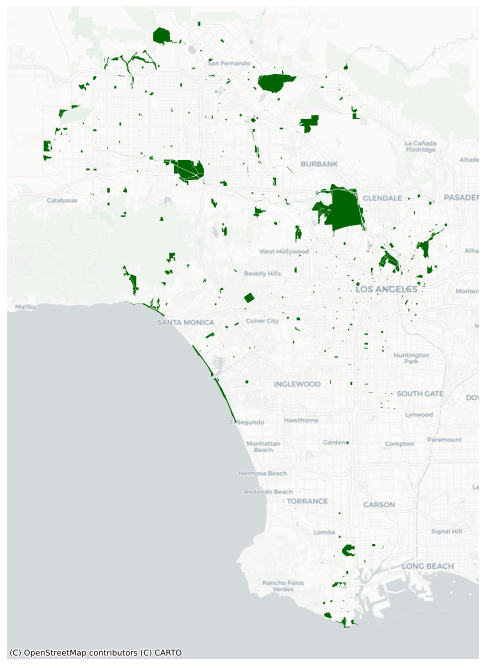

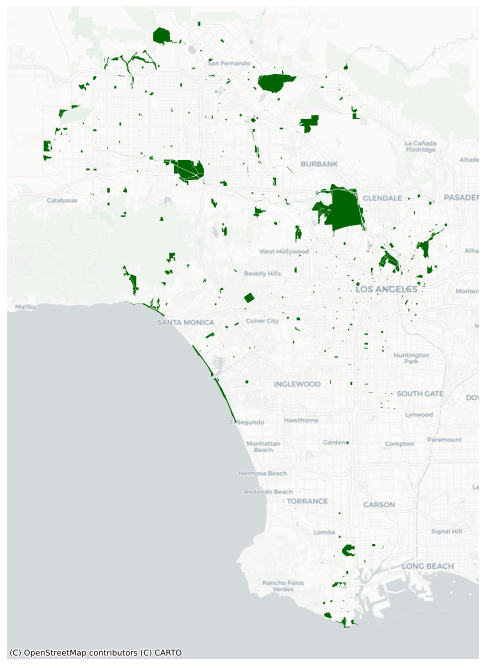

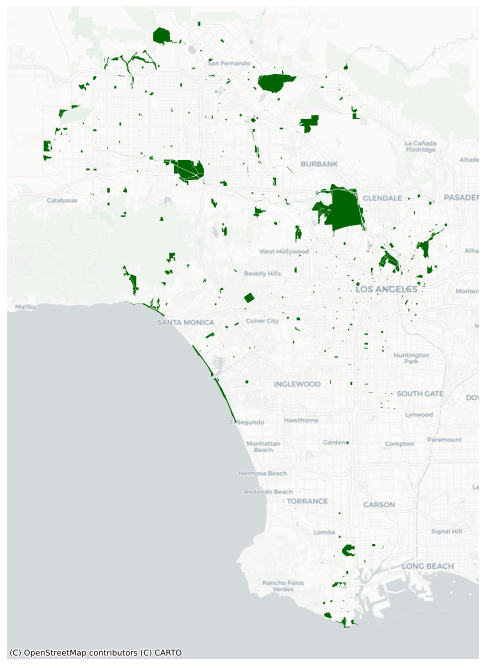

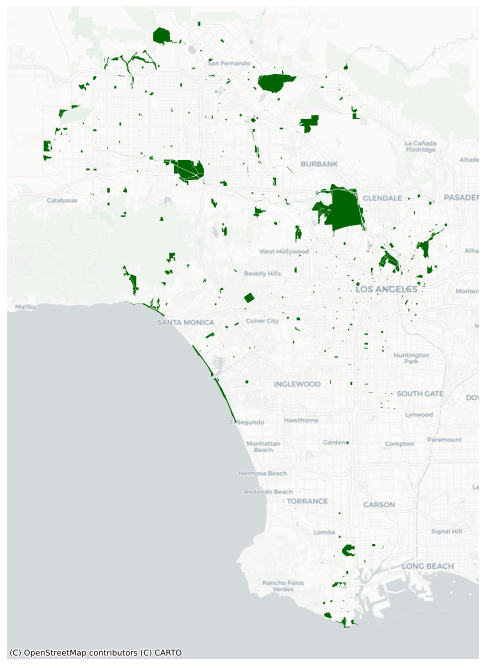

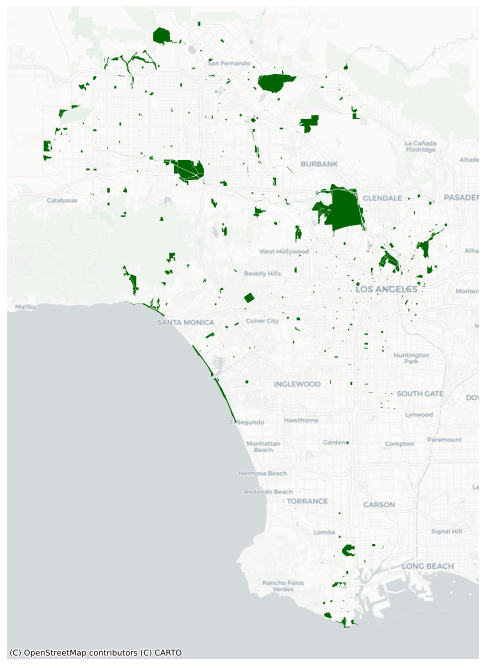

...

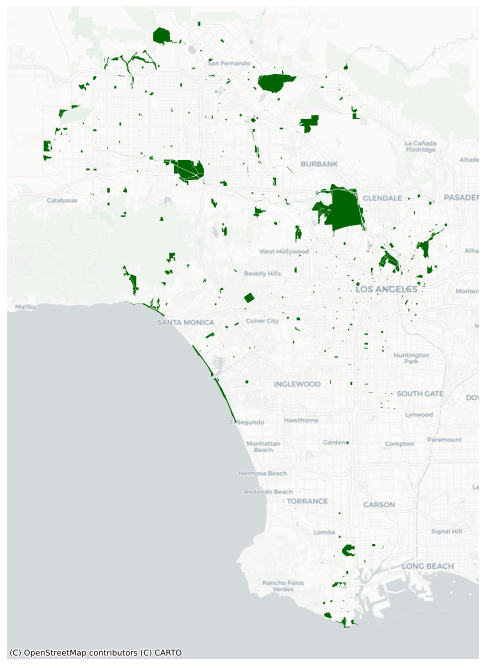

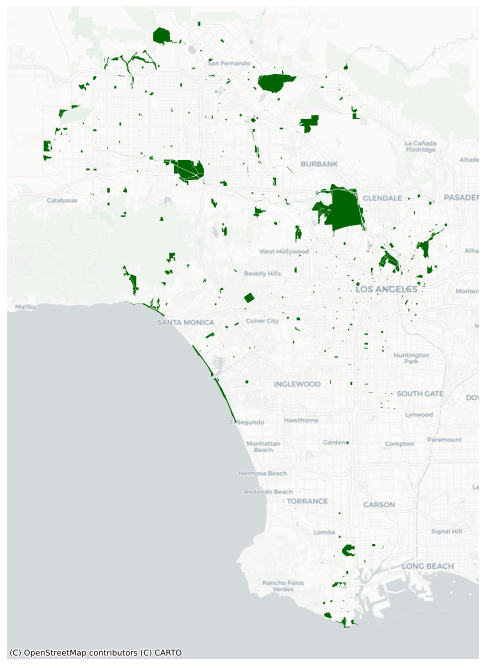

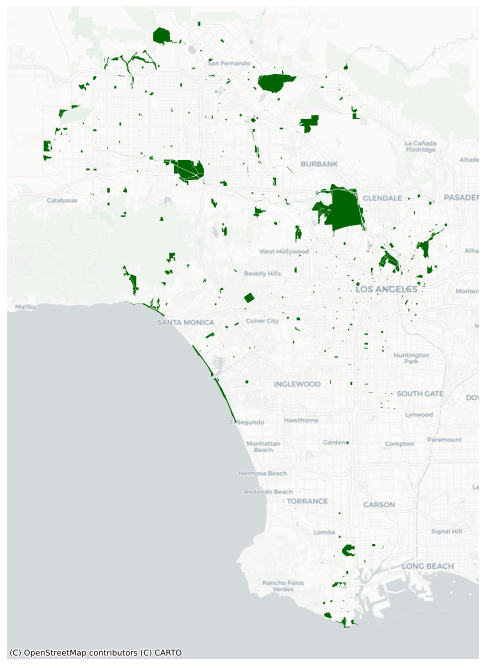

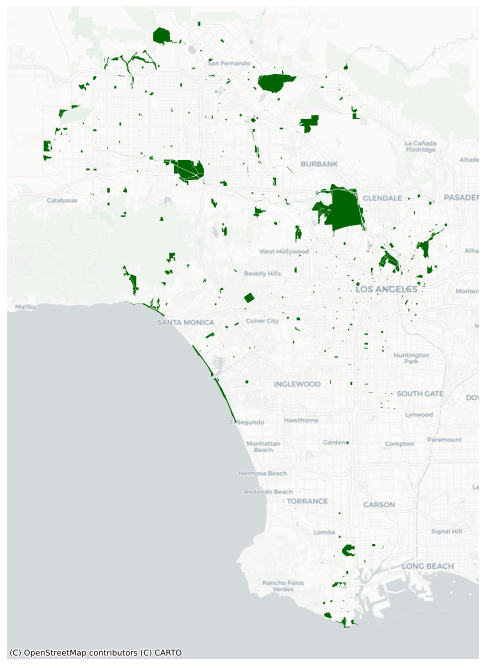

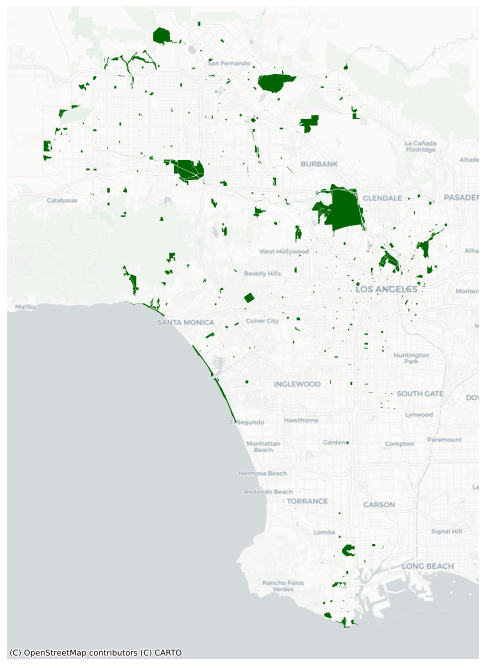

In [25]:
# this doesn't work sadly
def parks_by_district(councildistrict):
    fig, ax = plt.subplots(figsize=(12,12))

    # add the layer with ax=ax in the argument 
    parks_mercator.plot(ax=ax,
                        color="darkgreen"
                       )

    # turn the axis off but set custom axes
    ax.axis('off')
    ax.set_ylim([3985000, 4075000])
    ax.set_xlim([-13215000, -13150000])
    
    # add a basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
    
# list of districts
districts = ['10','01','15','09','11','06','04','13','14','07','08','12','03','05','02']

for district in districts:
    parks_by_district(councildistrict=district)

In [ ]:
# this crashes jupyter hub when we try to run it

def parks_by_district(district):
    fig, ax = plt.subplots(figsize=(12,12))

    # add the layer with ax=ax in the argument 
    parkslil.plot(ax=ax,
                        color="darkgreen"
                       )

    # turn the axis off but set custom axes
    ax.axis('off')
    ax.set_ylim([3985000, 4075000])
    ax.set_xlim([-13215000, -13150000])
    
    # add a basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
    
# list of districts
districts = parks.cd_real

for district in districts:
    parks_by_district(district)    

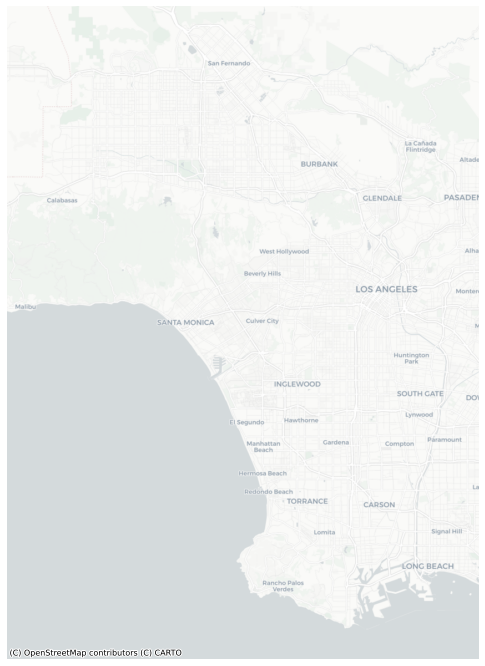

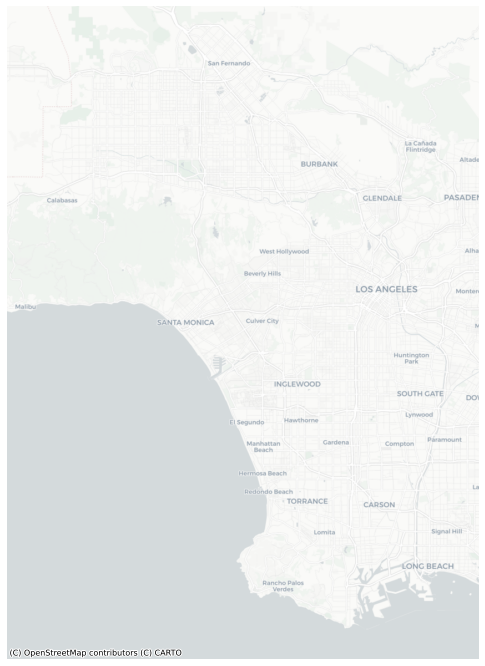

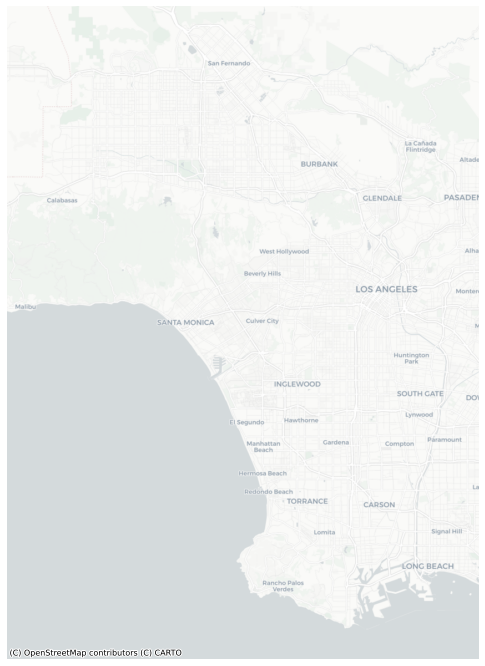

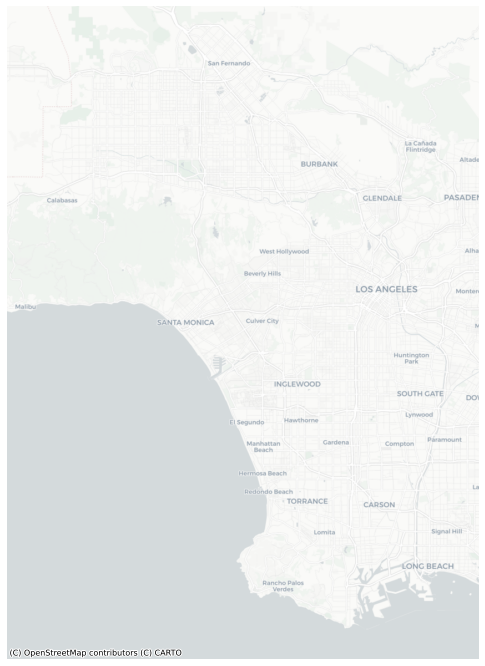

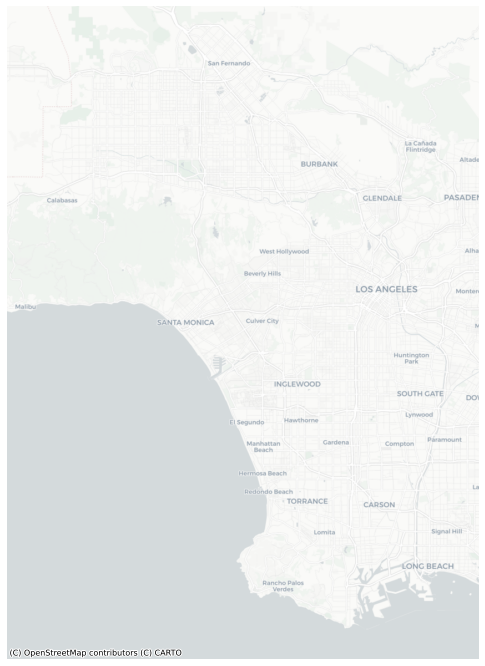

...

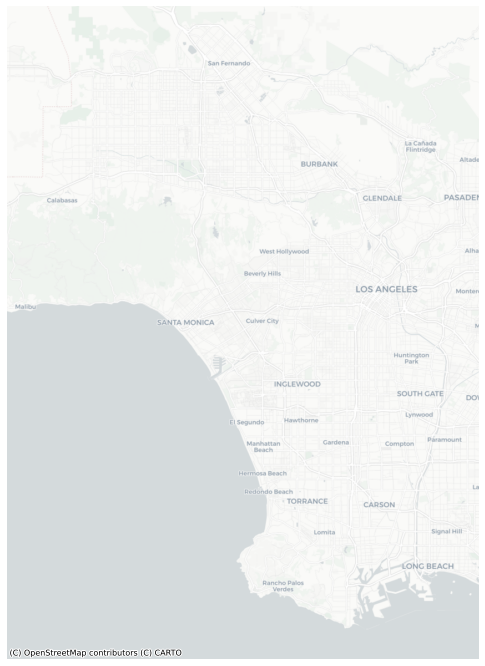

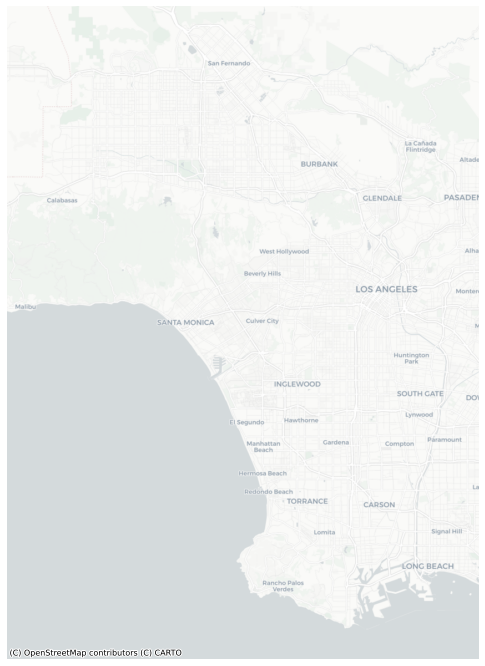

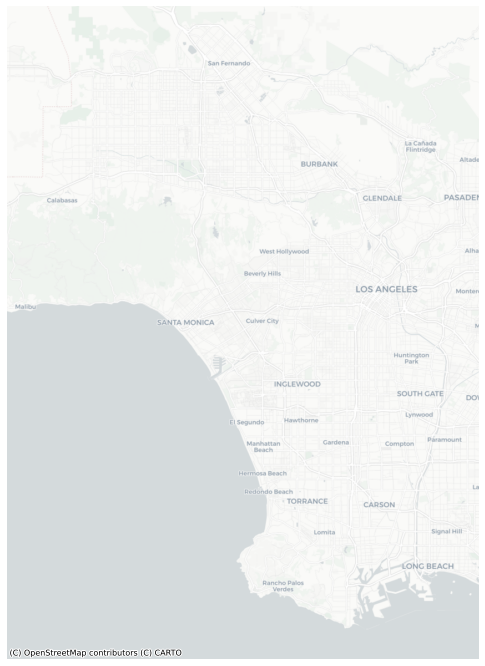

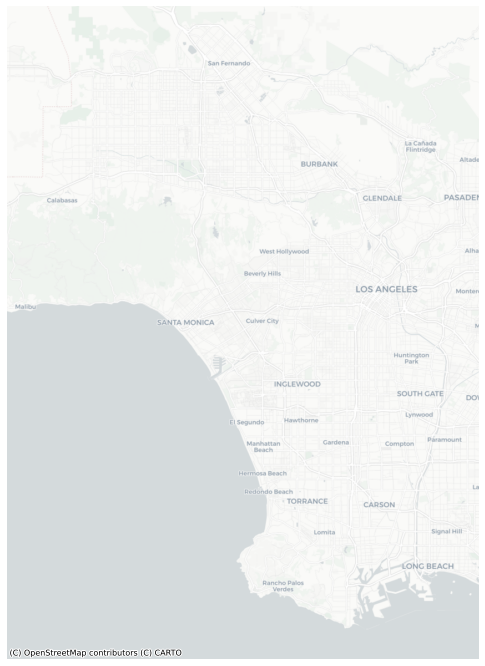

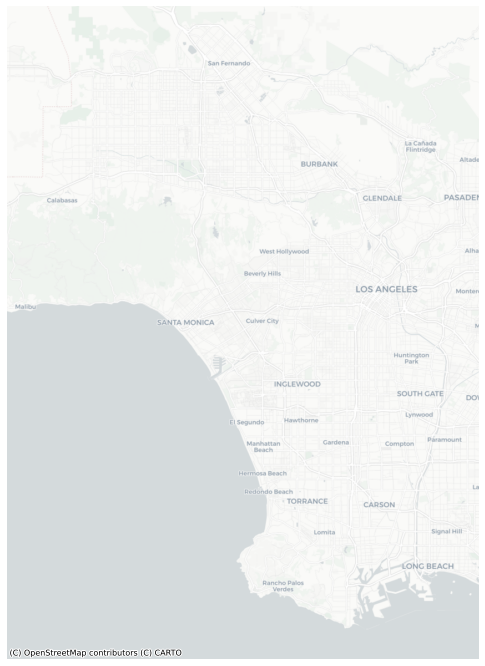

In [13]:
# this got rid of the parks entirely??

def parks_by_district(district):
    fig, ax = plt.subplots(figsize=(12,12))

    # add the layer with ax=ax in the argument 
    parks.plot(ax=ax,
                        color="darkgreen"
                       )

    # turn the axis off but set custom axes
    ax.axis('off')
    ax.set_ylim([3985000, 4075000])
    ax.set_xlim([-13215000, -13150000])
    
    # add a basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
    
# list of districts
districts = parks.cd_real.unique()

for district in districts:
    parks_by_district(district)    

In [14]:
# trying to narrow it down...
parkslil = parks_mercator.head(10)

In [15]:
parkslil

,name,shape_area,objectid,park_id,name_alpha,shape_leng,area_acres,issubpark,region,address,name_publi,park_class,cd_real,geometry,centroid
0,Robert F Kennedy Inspiration Memorial Park,6501.37488025,1,1056,ROBERT F KENNEDY PARK (LAUSD) JUA,641.47054538,0.149251627315,N,M,"3400 W Wilshire Blvd, LA 90010",Kennedy (Robert F) Inspiration Memorial Park (...,N,10,"MULTIPOLYGON (((-13168868.269 4037078.847, -13...",POINT (-118.29749 34.06159)
1,Sycamore Grove Park,691462.199493,2,736,SYCAMORE GROVE PARK,6227.3991903,15.8738513625,N,M,"4702 N Figueroa St, LA 90042",Sycamore Grove Park,C,01,"MULTIPOLYGON (((-13158086.069 4042417.355, -13...",POINT (-118.20301 34.10007)
2,San Pedro Welcome Park,17402.1579777,3,328,SAN PEDRO WELCOME PARK,560.372862441,0.399500174163,N,P,"451 N Gaffey St, San Pedro 90731",Formerly Welcome Park,N,15,"MULTIPOLYGON (((-13168300.673 3994746.644, -13...",POINT (-118.29264 33.74621)
3,Country Club Heritage Park,3647.84860118,4,1045,COUNTRY CLUB PARK HERITAGE PLAZA,287.523337381,0.0837434158085,N,M,"1015 S Wilton Pl, LA 90018",AKA Wilton Place Park,N,10,"MULTIPOLYGON (((-13170769.576 4035829.429, -13...",POINT (-118.31481 34.05236)
4,Watts Cultural Crescent,128793.355722,5,1046,WATTS CULTURAL CRESCENT,2852.11033344,2.95670043382,N,P,"1780 E Santa Ana Blvd, LA 90002",AKA Watts Towers Cultural Cresent,N,15,"MULTIPOLYGON (((-13162663.079 4020674.178, -13...",POINT (-118.24096 33.93896)
5,Wall Street Community Park,4441.07000041,6,1047,WALL STREET COMMUNITY PARK,271.030530962,0.101953346298,N,P,"8620 S Wall St, LA 90003",Wall Street Park,N,09,"MULTIPOLYGON (((-13165918.147 4023356.383, -13...",POINT (-118.27145 33.95951)
6,Linnie Canal Park,5703.74063741,49,140,CANAL PARK,310.126961352,0.13094039147,N,W,"401 E Linnie Canal Walk, Venice 90291",AKA Linnie Canal Park,N,11,"MULTIPOLYGON (((-13187629.910 4026750.075, -13...",POINT (-118.46659 33.98482)
7,South East Valley Roller & Skateboard Park,95687.4152304,7,1048,SOUTH EAST VALLEY ROLLER & SKATEBOARD PARK,1412.93983855,2.19668957716,N,V,"12477-12511 W Sheldon St, LA 91352",AKA Sheldon Skate Park,N,06,"MULTIPOLYGON (((-13180860.460 4059822.572, -13...",POINT (-118.40575 34.23115)
8,Cahuenga Peak Phase ||,686665.048908,8,1049,CAHUENGA PEAK PHASE ||,4368.4967932,15.7637234981,Y,G,"3698 W Wonder View Dr, LA 90068",Griffith Park Region,R,04,"MULTIPOLYGON (((-13171610.962 4047121.850, -13...",POINT (-118.32403 34.13624)
9,Cahuenga Peak Phase |,4997768.53913,9,1050,CAHUENGA PEAK PHASE |,9839.98883789,114.733437334,Y,G,"3698 W Wonder View Dr, LA 90068",Griffith Park Region,R,04,"MULTIPOLYGON (((-13171868.854 4047150.913, -13...",POINT (-118.32945 34.13672)


In [ ]:
# still crashes...

def parks_by_district(district):
    fig, ax = plt.subplots(figsize=(12,12))

    # add the layer with ax=ax in the argument 
    parkslil.plot(ax=ax,
                        color="darkgreen"
                       )

    # turn the axis off but set custom axes
    ax.axis('off')
    ax.set_ylim([3985000, 4075000])
    ax.set_xlim([-13215000, -13150000])
    
    # add a basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
    
# list of districts
districts = parks.cd_real

for district in districts:
    parks_by_district(district)    

/tmp/ipykernel_875/87454220.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(12,12))
